## Цель: использовать негативные отзывы как негативный триггер


## Гипотеза: 
нельзя исплользовать негативный отзыв as is , т.к если для нас важны нарушения по цене и актуальности, то учитывать в триггерах отзывы про невежливого продавца некорректно. (в данном файле рассмотрим поиск негативных отзывов по цене)


**Что надо сделать?**: надо понять какие ключевые слова определяют отзывы, где пользователи жалуются на цену и актуальность объявления и далее по ключевым словам находить негативные триггеры (в базе данных храняться вся инфа по отзывам, т.е мы сможем составить регулярки которые будут вытаскивать отзывы с жалобой на цену и актуальность)

**Как сделать?**: бьем все негативные отзывы по кластерам -> находим нужные нам кластеры, где отзывы по цене и актуальности -> проводим частотный анализ и определяем ключевые слова/фразы

In [18]:
import re
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize
from pymorphy2 import MorphAnalyzer
import numpy as np
import matplotlib.pyplot as plt

import vertica_python as vp
import numpy as np
import pandas as pd

import wordcloud
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import nltk
from nltk.probability import FreqDist
from string import punctuation

from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer
import pymorphy2
from nltk import sent_tokenize

import vertica_python as vp
import numpy as np
import pandas as pd

import torch
from transformers import AutoTokenizer, AutoModel

from transformers import T5ForConditionalGeneration, T5Tokenizer
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity

from sklearn.datasets import make_blobs


import warnings
warnings.filterwarnings('ignore')

from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.metrics.pairwise import pairwise_distances_argmin

In [ ]:
##получаем данные из базы данных

In [2]:
conn_conf = {'host': '',
 'port': ,
 'user': '',
 'password':  '', ####### password
 'database': '',
 'session_label': 'python',
 'unicode_error': 'string',
 'ssl': False,
 'autocommit': True,
 'user_prepare_statements': False,
 'connection_timeout': 8000}

In [3]:
%%time


q_tmp_review = f"""
 SELECT * FROM reviews
"""


with vp.connect(**conn_conf) as connection:
    cur = connection.cursor()
    cur.execute(q_tmp_review)
    df_data = pd.DataFrame(cur.fetchall())

CPU times: user 885 ms, sys: 106 ms, total: 991 ms
Wall time: 1.87 s


In [15]:
df_data.head(2)

,create_date,vertical,logical_category,item_id,review_id,comment
0,2023-05-17,Services,Services.HealthAndBeauty,1445029750135,510641250007,не отвечает на сообщения
1,2023-05-17,Services,Services.MajorRepair,1380931751233,510644750014,не выходит на связь!


In [5]:
df_data.columns = ['create_date', 'vertical', 'logical_category',
              'item_id', 'review_id', 'comment']

#### Для кластеризации попробуем два метода, схожих друг на друга: K-means и MiniBatchKMeans
посмотрим как будут работать, если какая-то из этих кластеризаций покажет себя хорошо, то остановимся.
в т.ч был взят MiniBatchKMeans потому что он еще и требует меньших ресурсов при обучении и достаточно быстр.
Начнем с него

## MiniBatchKMeans

In [30]:
bad_words = "[A-Za-z0-9!#$%&'()*+,./:;<=>?@[\]^_{|}~\"\-]+"
morph = MorphAnalyzer()
def token_only(text):
    text = re.sub(bad_words,' ',text)
    tokens = [word.lower() for sent in sent_tokenize(text) for word in word_tokenize(sent)]
    filtered_tokens = []
    for token in tokens:
        token = token.strip()
        token = morph.normal_forms(token)[0]
        filtered_tokens.append(token)
    return filtered_tokens

In [31]:
stoplist = set(stopwords.words("russian"))

In [32]:
dfclall = df_data['comment']
tfidf_vectorizer = TfidfVectorizer(smooth_idf=True,max_df=0.6,min_df=0.01,max_features=100000,
                                   stop_words=stoplist,
                                   use_idf=True,tokenizer=token_only, ngram_range=(1,3))

In [33]:
tfidf_matrix = tfidf_vectorizer.fit_transform(dfclall)
dfClaster= df_data

In [34]:
mbk  = MiniBatchKMeans(n_clusters=20,init='random').fit(tfidf_matrix)
y_kmeansMBK = mbk.predict(tfidf_matrix)
Num = [] 
Num = [pt for pt in y_kmeansMBK]
df2 = {"Num_Cluster": Num}
dfMBK = pd.DataFrame(df2)
df = pd.concat([dfClaster,dfMBK], axis=1)

In [35]:
mbk_means_cluster_centers = np.sort(mbk.cluster_centers_, axis = 0)
mbk_means_labels = pairwise_distances_argmin(tfidf_matrix, mbk_means_cluster_centers)

In [36]:
#самый большой кластер 9
df.Num_Cluster.value_counts().sort_values()

7       426
18      614
1       675
10      993
5      1025
3      1496
12     1500
6      1543
4      1738
11     2026
14     2266
15     2276
0      2580
19     2839
16     3010
8      3143
2      3445
17     3717
13     4318
9     11239
Name: Num_Cluster, dtype: int64

In [37]:
#посмотрим как выглядит каждый кластер
def show_examples(cluster, n):
    return df[df['Num_Cluster'] == cluster]['comment'][:n].unique()

show_examples(cluster=9, n=10)

array(['не выходит на связь!',
       'ремонт свч печи. назвали цену замены колпачка магнетрона или слюды в 1000р. сама слюда стоит 150р, и колпачёк столько же. замена магнетрона 4000р. а магнетрон вообще то стоит 1450р. нашёл новую микроволновку за 3400р на маркете. аппетиты у ребят хорошие.',
       'для записи хотела уточнить стоимость, тк в профиле написано «от» для понимания ценового диапазона. девушка так и не ответила.',
       'два дня подряд звонил, трубку не берут. и не перезвонили! сообщения отключены!',
       'работник не хочет выполнять сваю работу я ему написал сказал позвонить званю пишу молчит не тратьте время зря на него.',
       'андрей сам не смог, прислал виталия, виталий прислал еще парня, в итоге 15000 рублей за метр погонный. работают как посредники. 2 звезды итолько потому что доехали в живую посмотреть.',
       'на мой отклик мне намисали ждите звонка. через пять дней объявление сняли, звонка  как не было так и нет.',
       'странный мастер, незаинтересован

## посмотрим каждый кластер используя анализ частотности

In [38]:
# Получение текстовой строки из списка слов
def str_corpus(corpus):
    str_corpus = ''
    for i in corpus:
        str_corpus += ' ' + i
    str_corpus = str_corpus.strip()
    return str_corpus
# Получение списка всех слов в корпусе
def get_corpus(data):
    corpus = []
    for phrase in data:
        for word in phrase.split():
            corpus.append(word)
    return corpus
# Получение облака слов
def get_wordCloud(corpus):
    wordCloud = WordCloud(background_color='white',
                              stopwords=russian_stopwords,
                              width=3000,
                              height=2500,
                              max_words=200,
                              random_state=42
                         ).generate(str_corpus(corpus))
    return wordCloud

In [39]:
russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['это', 'нею', 'avito', 'ru', 'прошу', 'объявлен', 'объявление', 'авито', 'данное', 'что', 'так', 'вот', 'быть', 'как', 'в', 'к', 'на', 'руб','который','продавец', 'рублей', 'рубль', 'р', 'т', 'тысяча', 'наш', 'свой', 'ки'])

In [40]:
stemmer = SnowballStemmer("russian")
wordnet_lemmatizer = WordNetLemmatizer()
morph = pymorphy2.MorphAnalyzer()

In [41]:
def remove_punct(text):
    table = {33: ' ', 34: ' ', 35: ' ', 36: ' ', 37: ' ', 38: ' ', 39: ' ', 40: ' ', 41: ' ', 42: ' ', 43: ' ', 44: ' ', 45: ' ', 46: ' ', 47: ' ', 58: ' ', 59: ' ', 60: ' ', 61: ' ', 62: ' ', 63: ' ', 64: ' ', 91: ' ', 92: ' ', 93: ' ', 94: ' ', 95: ' ', 96: ' ', 123: ' ', 124: ' ', 125: ' ', 126: ' '}
    return text.translate(table)

In [42]:
 ##почистим текст

In [43]:
df['text_clean'] = df['comment'].map(lambda x: x.lower())
df['text_clean'] = df['text_clean'].map(lambda x: remove_punct(x))
df['text_clean'] = df['text_clean'].map(lambda x: x.replace('ё', 'e'))
df['text_clean'] = df['text_clean'].map(lambda x: re.sub("самом деле|друг друга|руб([а-яё]{0,4})|[0-9]{1,12}р([а-яё]{0,4})|[A-Za-z]+|₽|[0-9]{1,12}", "", x))
df['text_clean'] = df['text_clean'].map(lambda x: x.split(' '))
df['text_clean'] = df['text_clean'].map(lambda x: [token for token in x if token not in russian_stopwords\
                                                                  and token != " " \
                                                                  and token.strip() not in punctuation]
                                                                  )

#лемматизация
df['text_clean'] = df['text_clean'].map(lambda x: [morph.parse(token)[0].normal_form for token in x if morph.parse(token)[0].normal_form not in russian_stopwords\
                                                                  and token != " " \
                                                                  and token.strip() not in punctuation
                                                                  and len(morph.parse(token)[0].normal_form) > 2
                                                   ])

df['text_clean'] = df['text_clean'].map(lambda x: ' '.join(x))

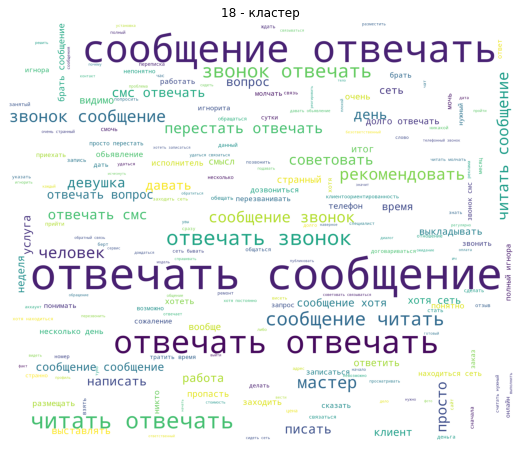

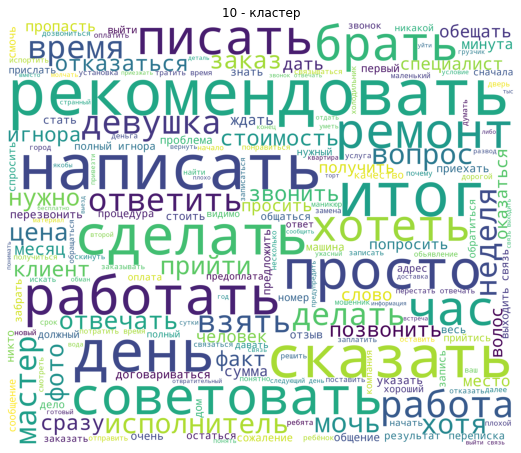

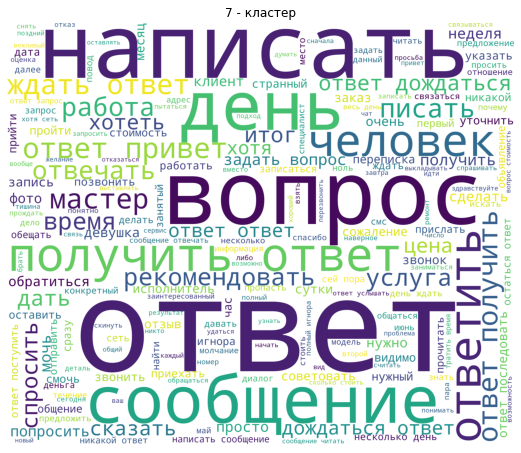

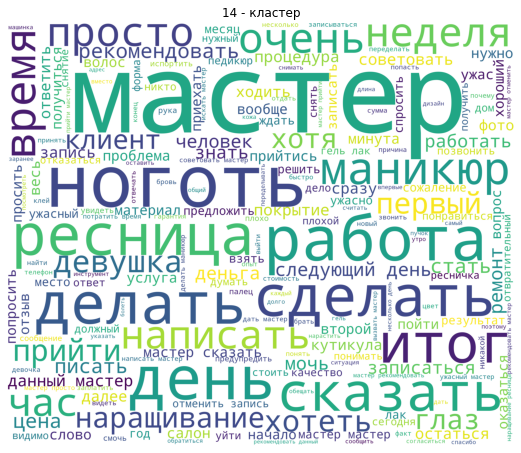

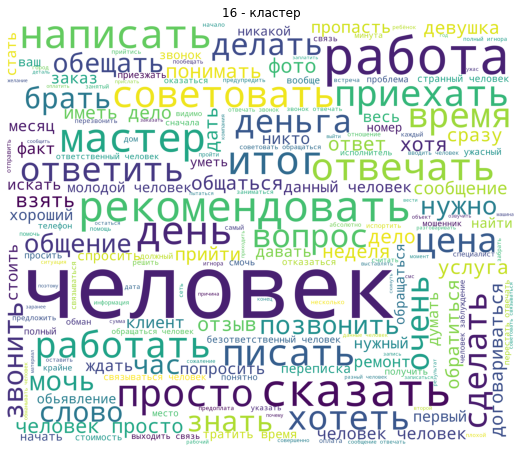

...

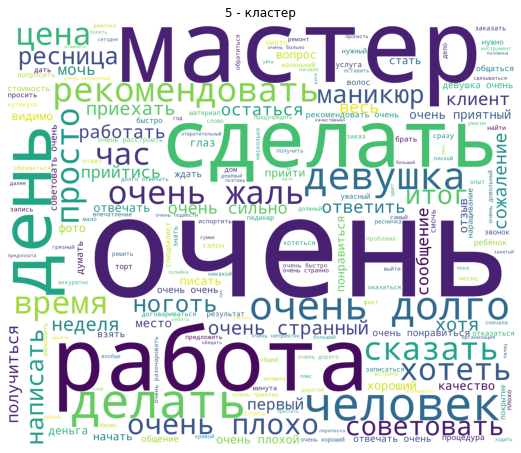

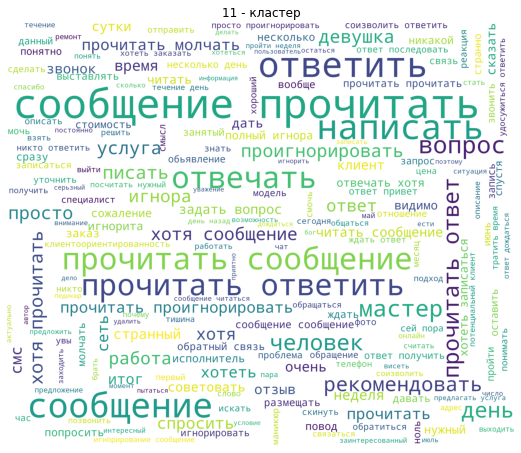

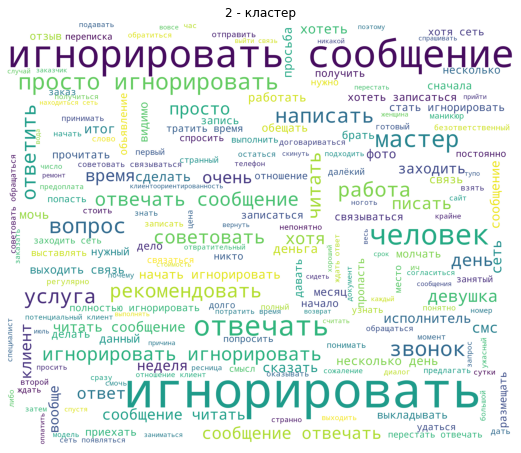

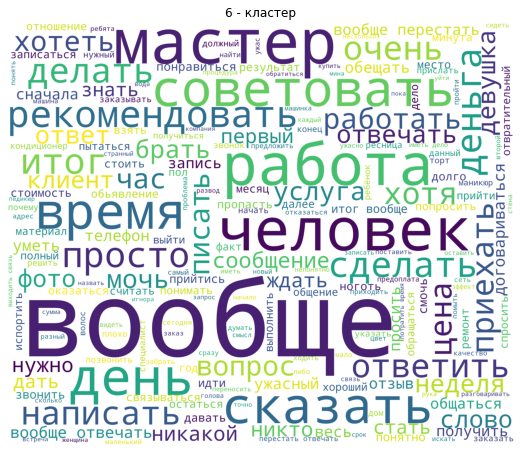

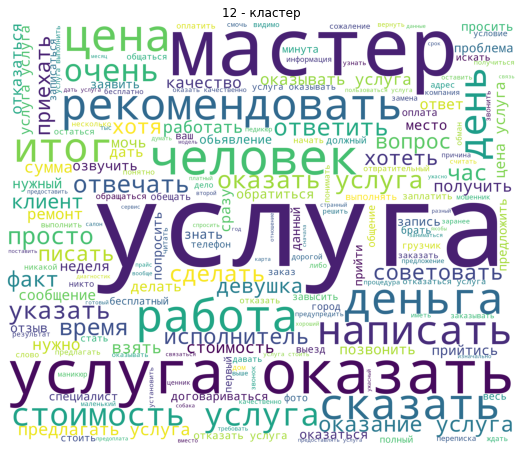

In [44]:
for i in df.Num_Cluster.unique():
    corpus = get_corpus(df[df.Num_Cluster == i]['text_clean'].values)
    procWordCloud = get_wordCloud(corpus)
  
    fig = plt.figure(figsize=(20, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(procWordCloud)
    plt.axis('off')
    plt.subplot(1, 2, 1)
    plt.title(f'{i+1} - кластер')

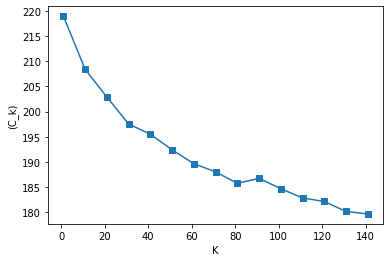

In [20]:
#определим оптимальное кол-во кластеров
#тут можно увидеть где оптимальное кол-во кластеров
#нужно найти ту точку, после которой инерция начнёт почти линейно уменьшаться,здесь после 30ки
inertia = []
for k in range(1,150,10):
    mbk  = MiniBatchKMeans(n_clusters=k,init='random', random_state=1).fit(tfidf_matrix)
    inertia.append(np.sqrt(mbk.inertia_))
plt.plot(range(1,150,10),inertia,marker='s')
plt.xlabel('K')
plt.ylabel('(C_k)')
plt.show()

# K-means 

In [ ]:
#разбиваем текст каждого отзыва на токены

In [6]:
sentences = list(set(list(df_data['comment'])))

In [7]:
tokenizer = AutoTokenizer.from_pretrained("cointegrated/LaBSE-en-ru")

In [8]:
model = AutoModel.from_pretrained("cointegrated/LaBSE-en-ru")

Some weights of the model checkpoint at cointegrated/LaBSE-en-ru were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [9]:
embeddings_list = []

for s in sentences:
    encoded_input = tokenizer(s, padding=True, truncation=True, max_length=64, return_tensors='pt')
    with torch.no_grad():
        model_output = model(**encoded_input)
    embedding = model_output.pooler_output
    embeddings_list.append((embedding)[0].numpy())

embeddings = np.asarray(embeddings_list)

### Get optimum number of clusters

In [11]:
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity

def determine_k(embeddings):
    k_min = 2
    
    clusters = [x for x in range(2, k_min * 11)]
   
    metrics = []
    
    for i in clusters:
        metrics.append((KMeans(n_clusters=i).fit(embeddings)).inertia_)
    
    k = elbow(k_min, clusters, metrics)
    return k

def elbow(k_min, clusters, metrics):
    score = []

    for i in range(k_min, clusters[-3]):
        y1 = np.array(metrics)[:i + 1]
        y2 = np.array(metrics)[i:]
    
        df1 = pd.DataFrame({'x': clusters[:i + 1], 'y': y1})
        df2 = pd.DataFrame({'x': clusters[i:], 'y': y2})
    
        reg1 = LinearRegression().fit(np.asarray(df1.x).reshape(-1, 1), df1.y)
        reg2 = LinearRegression().fit(np.asarray(df2.x).reshape(-1, 1), df2.y)

        y1_pred = reg1.predict(np.asarray(df1.x).reshape(-1, 1))
        y2_pred = reg2.predict(np.asarray(df2.x).reshape(-1, 1))    
        
        score.append(mean_squared_error(y1, y1_pred) + mean_squared_error(y2, y2_pred))

    return np.argmin(score) + k_min
     


In [15]:
k_opt = determine_k(embeddings)

In [48]:
k_opt

15

In [11]:
kmeans = KMeans(n_clusters = k_opt, random_state = 42).fit(embeddings)
kmeans_labels = kmeans.labels_

In [13]:
data = pd.DataFrame()
data['text'] = sentences
data['label'] = kmeans_labels
data['embedding'] = list(embeddings)

In [14]:
# Get nearest sentences to each center sentenses
kmeans_centers = kmeans.cluster_centers_
top_texts_list = []
for i in range (0, k_opt):
    cluster = data[data['label'] == i]
    embeddings = list(cluster['embedding'])
    texts = list(cluster['text'])
    distances = [euclidean_distances(kmeans_centers[0].reshape(1, -1), e.reshape(1, -1))[0][0] for e in embeddings]
    scores = list(zip(texts, distances))
    top_3 = sorted(scores, key=lambda x: x[1])[:3]
    top_texts = list(zip(*top_3))[0]
    top_texts_list.append(top_texts)
     

In [18]:
MODEL_NAME = 'cointegrated/rut5-base-absum'
model = T5ForConditionalGeneration.from_pretrained(MODEL_NAME)
tokenizer = T5Tokenizer.from_pretrained(MODEL_NAME)

In [34]:
def show_examples(cluster, n):
    return data[data['label'] == cluster]['text'][:n].unique()
show_examples(cluster=10, n=20)

array(['н совсем то чтот ждали,качествохорошие корней практический нет в челом товар хороший только мало,в принцепе за такие деньгинорм если брать что полный мешок стоит 250 р',
       'непорядочные исполнители. большая часть листовок не была расклеена😡😡',
       'ребята не обязательные!!! пожилой человек приехал в назначенное время,ждал когда приедут чистить диван. в итоге не приехали,не сообщили, просто пропали. если вы размещаете объявление об услугах, то соответствуйте заявленным условиям!',
       'къваршня хочешь бабки и кинуть 😄 я сам могу так жить 100т оплатить и потом жди вас по пол года😄 пацана уже кинули так на деньги шас найти не может 🤦\u200d♂️',
       'контора отвратительная!!!расчёт на лохов. чтобы повесить рольшторы мастер изучал ютуб. за 4 рольшторы которые стоят 500 рублей они содрали 4000 рублей.не рекомендую обращаться.',
       'ввели в заблуждение,потом  сняли с публикации, тем самым обнадежили людей. нельзя так.',
       'буду краток. поклеено просто ужасно. даж

In [39]:
show_examples(cluster=6, n=25)

array(['оставляла отзыв ранее, но его удалили. мне не сложно написать еще раз, связываться с этой фирмой не стоит. цены за работу очень высокие, я заплатила 5800 за замену бочка, у частника такая же работа стоит 1000. не рекомендую!',
       'просто обалдеть! за одну маленькую муфточку, которую нужно было сделать по образцу на фото ниже запросил 2000 рублей.',
       'написал от 1500 руб . у меня объём больше . и зачем тогда размещал обьявление',
       'цена авто по дрому 160000.\nавто на ходу,нет номеров и стс.\nпредлагает 40000🤦\u200d♂️🤦\u200d♂️🤦\u200d♂️\nда я один двигатель продам за эту цену !!!!!\nавто кариб ае95 без дыр.',
       'разводная контора , за снять установить полотенце сушитель и поменять прокладки в двух американках мастер николай запросил 11 тыс ( после установки ) дал 6 хотя работы стоят максимум 2 тыс . на что николай сказал что снять поставить у них стоит только 4 тысячи а он делал это два раза )))) не советую',
       'в объявлении указано 1200,а озвучено 2000.'

In [24]:
show_examples(cluster=2, n=3)

20    менеджер по телефону сказал, что диагностика с...
22    категорически не советую,приехали загрузили по...
24    со слов оператора/менеджера: до тонны вывоз пл...
Name: text, dtype: object

In [25]:
show_examples(cluster=3, n=3)

11                    трубку во время не взял
12    сообщения читает,на вопросы не отвечает
34             не отвечают, зачем объявление?
Name: text, dtype: object

In [45]:
#просуммируем тесты кластеров (сделаем короткую выжимку, наиболее четко описывающий кластер)

In [20]:
def summarize(
    text, n_words=None, compression=None,
    max_length=1000, num_beams=3, do_sample=False, repetition_penalty=10.0, 
    **kwargs
):
    """
    Summarize the text по след параметрам:
    - n_words (int) примерное кол-во слов для генерации.
    - compression (float) - это приблизительное соотношение длины саммари и оригинального текста.
    """
    if n_words:
        text = '[{}] '.format(n_words) + text
    elif compression:
        text = '[{0:.1g}] '.format(compression) + text
    # x = tokenizer(text, return_tensors='pt', padding=True).to(model.device)
    x = tokenizer(text, return_tensors='pt', padding=True)
    with torch.inference_mode():
        out = model.generate(
            **x, 
            max_length=max_length, num_beams=num_beams, 
            do_sample=do_sample, repetition_penalty=repetition_penalty, 
            **kwargs
        )
    return tokenizer.decode(out[0], skip_special_tokens=True)

In [21]:
summ_list = []
for top in top_texts_list:
    summ_list.append(summarize(' '.join(list(top))))

In [22]:
top_texts_list

[('обещали выезд мастера на конкретный день, обещали что мастер предварительно позвонит. ни того, ни другого - только потратили мое время впустую и я сижу без связи! не рекомендую связываться с этими трепачами',
  'контора ненормальная. сколько ни звонил - мастера назначали приезд на конкретное время, но как итог никто даже и не приехал. трубку брали, договаривались, а дальше ничего, и так в течении недели. не рекомендую, поищите другой сервис.',
  'за 4 дня записалась на ресницы к этому "мастеру".времени было в обрез, т.к. уезжала на следующий день.к назначенному времени подьехала к дому,но алина на связь не вышла,ни на звонки,ни на смс не отвечала.полный игнор.хотя находилась в сети. меня просто "кинули"я потеряла время,все нарушились планы,срочно надо было искать другого мастера,испорчено настроение.ни предупреждения,ни последующих обьяснений и извинений не последовало. так на рынке услуг не делается.'),
 ('приехала, потратила полтора часа и что на выходе? администратор постоянно по

In [25]:
summ_list

['Поищите другого сервиса',
 'На сайте авито написано, что продавец не приехал забрать металл.',
 'Мне не нравится, что вы записаны на маникюр.',
 'На телефоне автоответчик вещает такой странный текст, что усомнились в адекватности человека.',
 'В пятницу после работы еду на транспорте в эту ж.мир',
 'На звонок не отвечают.',
 'Вместо того, чтобы померить разбитое стекло плиты в разобранном состоянии попросил 1000 за якобы вызов',
 'По телефону цена оказалась в 2,5 раза дороже по рынку. Не рекомендую данного мастера!',
 'Зачем размещать объявление на авито, если не отвечает на звонки?',
 'Взял деньги за пробный урок, взял символическую предоплату на запчасти и пропал на несколько дней.',
 'Мне не нравится этот «мастер»',
 'Не рекомендую обращаться с этим персонажем, который за день отменил запись сообщением в авито.',
 'Работу выполнил мастер, который не рекамендую.',
 'На сообщения не отвечают мошенники.',
 'Не рекомендую записываться к данному мастеру.']

In [26]:
data.label.value_counts()

10    4965
1     3417
2     3278
14    3032
0     2812
4     2716
6     2688
12    2218
11    2153
9     2017
7     1794
13    1733
3     1589
5     1300
8      951
Name: label, dtype: int64

In [27]:
data

,text,label,embedding
0,"н совсем то чтот ждали,качествохорошие корней ...",10,"[-0.36955833, -0.23137464, -0.74593234, 0.1050..."
1,"милая девушка, сделала работу, понравилось, но...",0,"[0.11633435, 0.24056853, -0.5161434, -0.828517..."
2,"примерно месяц сотрудничали с этим человком, с...",0,"[-0.47920612, 0.38336125, -0.17863476, -0.8668..."
3,"обманывают, в переписке когда договариваешься...",7,"[-0.9410508, -0.43713805, -0.610049, -0.035235..."
4,"сделать сделали, только как оказалось многое н...",1,"[-0.4644333, -0.4943806, -0.7141227, -0.221245..."
...,...,...,...
36658,прошел месяц все еще жду звонка,3,"[-0.009506941, 0.38107684, -0.64498734, -0.946..."
36659,обещали перезвонить через пару минут . но так ...,3,"[-0.6789242, 0.8423199, -0.8030161, -0.6300882..."
36660,"сообщения прочитаны , но не отвечает , трубки ...",13,"[-0.8478066, 0.8804348, -0.5843131, -0.4025178..."
36661,отказался выполнять услугу,12,"[-0.18584757, 0.5851134, -0.3136052, -0.689536..."


In [28]:
# Получение текстовой строки из списка слов
def str_corpus(corpus):
    str_corpus = ''
    for i in corpus:
        str_corpus += ' ' + i
    str_corpus = str_corpus.strip()
    return str_corpus
# Получение списка всех слов в корпусе
def get_corpus(data):
    corpus = []
    for phrase in data:
        for word in phrase.split():
            corpus.append(word)
    return corpus
# Получение облака слов
def get_wordCloud(corpus):
    wordCloud = WordCloud(background_color='white',
                              stopwords=russian_stopwords,
                              width=3000,
                              height=2500,
                              max_words=200,
                              random_state=42
                         ).generate(str_corpus(corpus))
    return wordCloud

In [29]:
def remove_punct(text):
    table = {33: ' ', 34: ' ', 35: ' ', 36: ' ', 37: ' ', 38: ' ', 39: ' ', 40: ' ', 41: ' ', 42: ' ', 43: ' ', 44: ' ', 45: ' ', 46: ' ', 47: ' ', 58: ' ', 59: ' ', 60: ' ', 61: ' ', 62: ' ', 63: ' ', 64: ' ', 91: ' ', 92: ' ', 93: ' ', 94: ' ', 95: ' ', 96: ' ', 123: ' ', 124: ' ', 125: ' ', 126: ' '}
    return text.translate(table)

In [30]:
russian_stopwords = stopwords.words("russian")
russian_stopwords.extend(['это', 'нею', 'avito', 'ru', 'прошу', 'объявлен', 'объявление', 'авито', 'данное', 'что', 'так', 'вот', 'быть', 'как', 'в', 'к', 'на', 'руб','который','продавец', 'рублей', 'рубль', 'р', 'т', 'тысяча', 'наш', 'свой', 'ки'])

In [31]:
stemmer = SnowballStemmer("russian")
wordnet_lemmatizer = WordNetLemmatizer()
morph = pymorphy2.MorphAnalyzer()

In [32]:
data['text_clean'] = data['text'].map(lambda x: x.lower())
data['text_clean'] = data['text_clean'].map(lambda x: remove_punct(x))
data['text_clean'] = data['text_clean'].map(lambda x: x.replace('ё', 'e'))
data['text_clean'] = data['text_clean'].map(lambda x: re.sub("самом деле|друг друга|руб([а-яё]{0,4})|[0-9]{1,12}р([а-яё]{0,4})|[A-Za-z]+|₽|[0-9]{1,12}", "", x))
data['text_clean'] = data['text_clean'].map(lambda x: x.split(' '))
data['text_clean'] = data['text_clean'].map(lambda x: [token for token in x if token not in russian_stopwords\
                                                                  and token != " " \
                                                                  and token.strip() not in punctuation]
                                                                  )
#стимминг
#df['text_clean'] = df['text_clean'].map(lambda x: [stemmer.stem(token) for token in x
#                                                            if stemmer.stem(token) not in russian_stopwords\
#                                                            and token != " " \
#                                                            and token.strip() not in punctuation])



#лемматизация
data['text_clean'] = data['text_clean'].map(lambda x: [morph.parse(token)[0].normal_form for token in x if morph.parse(token)[0].normal_form not in russian_stopwords\
                                                                  and token != " " \
                                                                  and token.strip() not in punctuation
                                                                  and len(morph.parse(token)[0].normal_form) > 2
                                                   ])

# не очень удасная попытка лемматизации другим способом
##df['text_clean'] = df['text_clean'].map(lambda x: [wordnet_lemmatizer.lemmatize(token) for token in x if token not in russian_stopwords\
##                                                                  and token != " " \
##                                                                  and token.strip() not in punctuation]) 
data['text_clean'] = data['text_clean'].map(lambda x: ' '.join(x))

/home/easemushina/virtualenvs/multiverse/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/home/easemushina/virtualenvs/multiverse/lib/python3.6/site-packages/ipykernel_launcher.py:10: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # Remove the CWD from sys.path while we load stuff.
/home/easemushina/virtualenvs/multiverse/lib/p

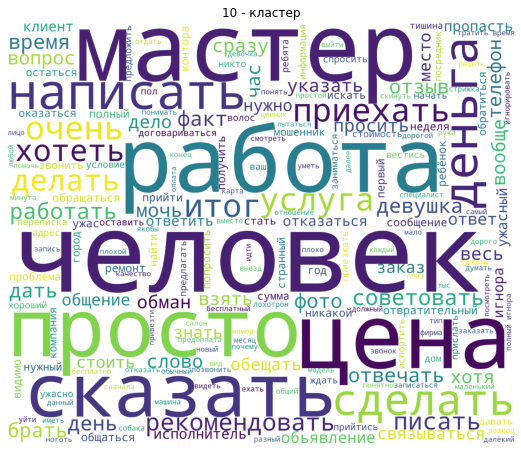

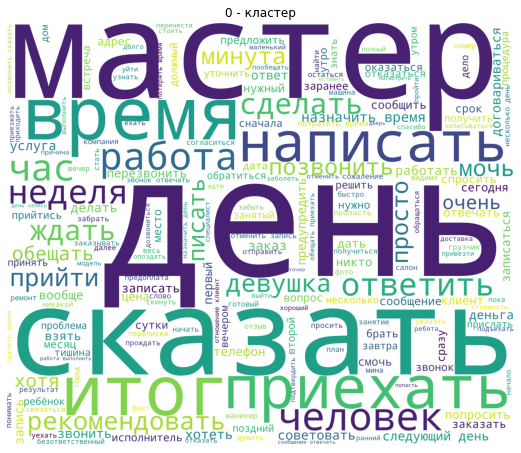

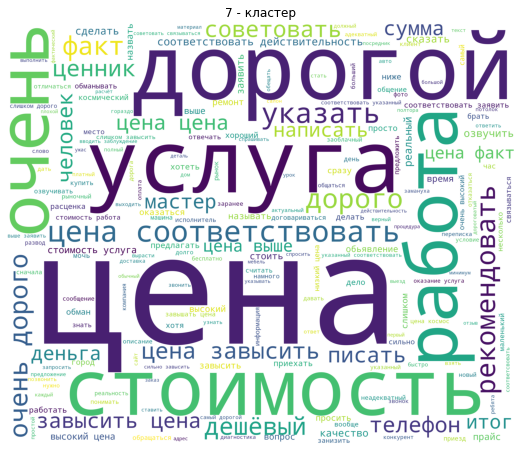

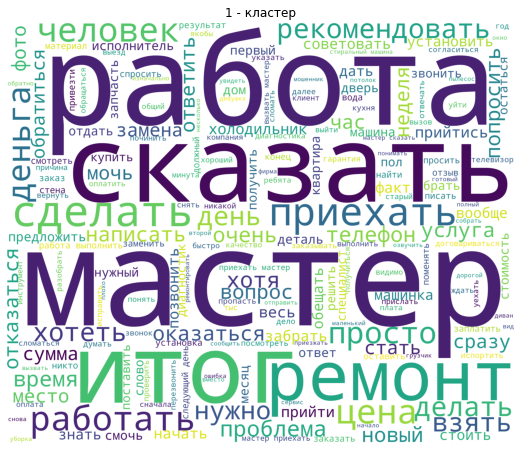

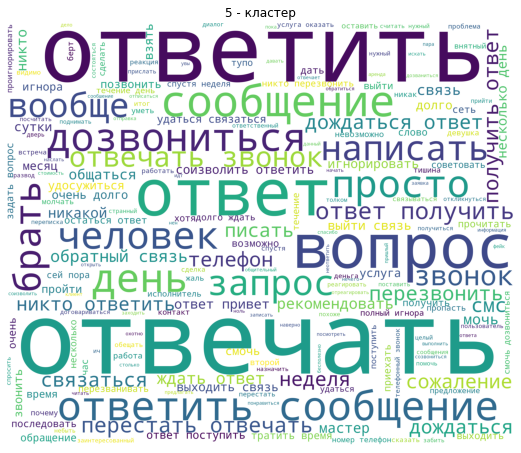

...

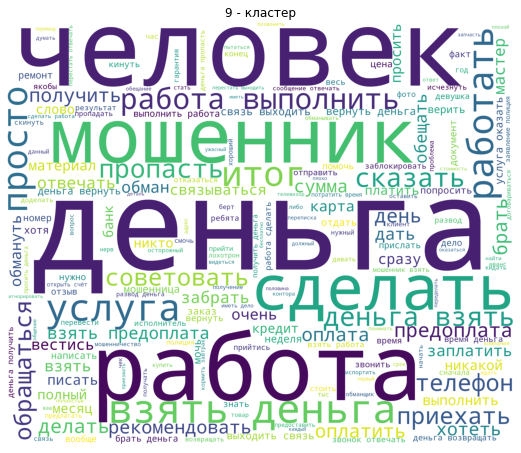

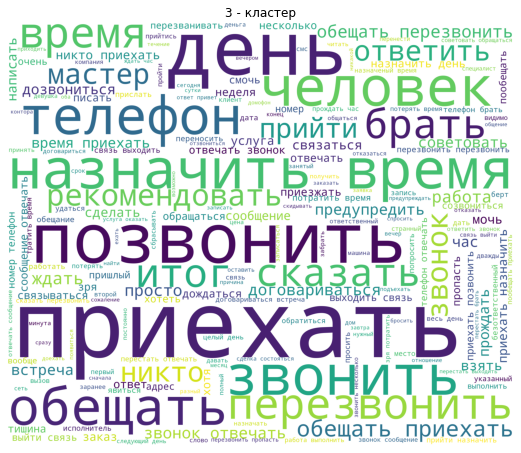

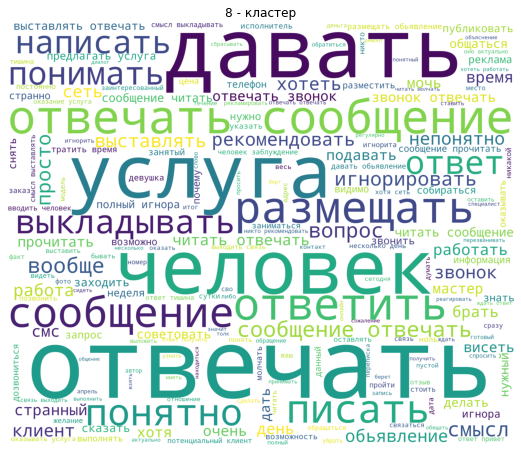

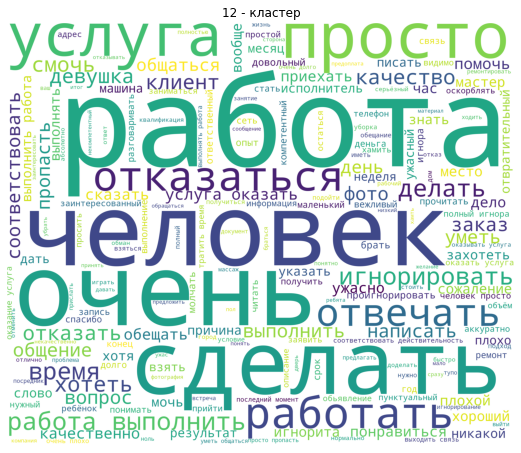

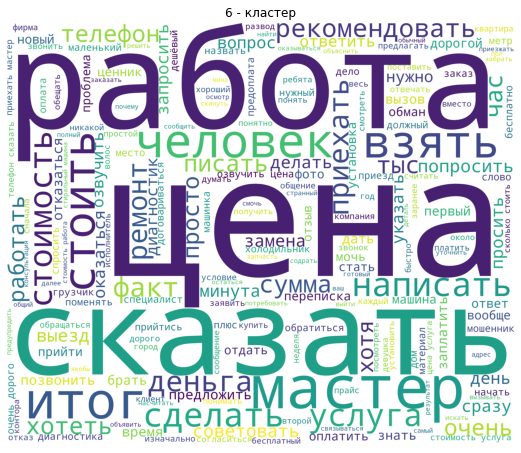

In [33]:
for i in data.label.unique():
    corpus = get_corpus(data[data.label == i]['text_clean'].values)
    procWordCloud = get_wordCloud(corpus)
    globals()["fdist_" + str(i)] = FreqDist(corpus)
  
    fig = plt.figure(figsize=(20, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(procWordCloud)
    plt.axis('off')
    plt.subplot(1, 2, 1)
    plt.title(f'{i} - кластер')

In [37]:
corpus_12 = get_corpus(data[data.label == 7]['text_clean'].values)
fdist_12 = FreqDist(corpus_12)
fdist_12.most_common(30)

[('цена', 1485),
 ('очень', 241),
 ('услуга', 222),
 ('дорого', 215),
 ('стоимость', 211),
 ('соответствовать', 205),
 ('завысить', 189),
 ('дорогой', 181),
 ('работа', 167),
 ('факт', 137),
 ('выше', 130),
 ('указать', 113),
 ('рекомендовать', 103),
 ('высокий', 90),
 ('дешёвый', 86),
 ('советовать', 80),
 ('человек', 79),
 ('заявить', 77),
 ('ценник', 70),
 ('слишком', 63),
 ('телефон', 63),
 ('писать', 62),
 ('действительность', 57),
 ('сумма', 57),
 ('время', 54),
 ('мастер', 53),
 ('написать', 51),
 ('итог', 49),
 ('деньга', 49),
 ('указанный', 48)]

## Саммари
Мы видим, четкие кластеры с ценой: 6 и 7 кластер. 
Опять же видим, что чаще всего кластеры про зря потраченное время и игнор со стороны продавца, или хамское поведение

Самый большой кластер - 10й. Данный кластер о том, что либо услугу оказали плохо и пришлось заплатить больше чем в объявлениие, либо связались с продавцом и он обсчитал намного больше чем в объявлении. И люди чувствую себя разведенными на деньги

6й кластер - ключевые слова: цена, стоимость, факт, сумма, очень
7й тоже похож на 6й, ключевые слова: сумма, цена, очень, дорого, завысить, выше, высокий, ценник: слишком

Дальше нет смысла смотреть, т.к для нашей задачи мы выделили нужный нам кластер и на этом можно остановитя

в итоге для базы данных были составлены регулярки 

In [ ]:
"""

regexp_like(lower(comment),
            '\b[0-9]{3,}\s?[р$€¥](уб|\s|\b|$)|\d{3,7}[ \.\-]{0,5}тыс|\d{3,7}[ \.\-]{0,5}т.{0,6}р|за шт.|цен[a|ник] не соответствует|цена[ \.\]{0,12} выше|обман с ценой|не[ \.\-]{0,5}верная цена|цен[a|ник] друг[ой|ая]|
            |цена[ \.\]{0,12} заниж[а-яё]{0,6}|цена указана неверно|нет по данной цене|стоит дороже|цена неверная|высокая цена|цена отличается от|цена завышен|цену меняли|деш[\w]{1,7} цен[\w]{1,3}|цен[\w]{1,3} ниже|доро[го|гой|же]|
            |фактическ[а-я]{0,3} (цен[а-я]{0,5}|стоимост[а-я]{0,2})'))     AS price_review
"""